In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sb

In [2]:
# Load data file --> without second header row (only necessary for data_flash.xlsx)
fl = pd.read_excel('Data/data_flash.xlsx', skiprows=[1])
m = pd.read_excel('Data/data_manufacturing.xlsx')

## Dataset Exploration

In [3]:
fl

,Pressure,Liquid flow,Temperature,Vapor flow,Mole fraction ethanol in vapor
0,8.396544,41.087268,423.686554,39.934969,0.588747
1,9.082950,48.346588,424.259215,31.457617,0.598482
2,6.216424,67.817254,408.585088,13.055781,0.623558
3,9.225468,59.510814,425.167629,22.426689,0.613161
4,9.664251,60.578692,424.739170,19.518728,0.612980
...,...,...,...,...,...
95,1.667272,51.473235,368.754325,26.801976,0.614382
96,6.464699,40.016087,410.139154,40.787753,0.589927
97,1.563050,58.028562,363.970901,22.552990,0.621157
98,8.090567,73.401544,418.364386,6.508422,0.626177


In [4]:
m

,API Particle Size,Mill Time,Screen Size,MgSt Supplier,Lactose Supplier,Sugar Supplier,Talc Supplier,Blend Time,Blend Speed,Compressor,Force,Coating Supplier,Coating Viscosity,Inlet Temp,Exhaust Temp,Spray Rate,Atom. Pressure,Dissolution
0,Small,27,4,Smith Ind,James Ind,Sour,Rough,16.043199,59.887383,COMPRESS2,25.466691,Mac,105.361158,107.945228,70.458995,404.603294,61.007068,79.86
1,Small,11,5,Jones Inc,James Ind,Sour,Smooth,14.361549,59.793030,COMPRESS2,24.934062,Mac,100.232484,107.540101,70.823684,407.367163,60.571220,72.82
2,Small,20,4,Jones Inc,Bond Inc,Sour,Rough,14.458745,60.797487,COMPRESS2,25.503908,Down,100.271603,106.605861,69.197350,399.301868,59.088228,74.18
3,Small,13,3,Smith Ind,Bond Inc,Sweet,Smooth,14.412131,59.398624,COMPRESS1,24.787632,Mac,98.008134,106.093734,68.809087,403.733927,58.844630,69.14
4,Small,13,5,Smith Ind,James Ind,Sweet,Smooth,16.111780,59.921639,COMPRESS2,25.316775,Down,97.582630,108.257381,69.447385,396.709347,59.589137,73.30
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
85,Large,5,4,Smith Ind,James Ind,Sour,Smooth,13.836013,59.105242,COMPRESS2,25.329694,Coat,101.600640,107.945423,69.915316,401.016280,61.196363,70.58
86,Large,14,3,Smith Ind,Bond Inc,Sweet,Rough,16.963847,61.302848,COMPRESS2,24.578408,Coat,102.168031,107.372107,70.598444,402.636540,59.608586,69.70
87,Large,9,5,Smith Ind,Bond Inc,Sour,Rough,16.505517,61.216797,COMPRESS2,25.013860,Mac,94.154164,107.142674,69.645683,398.417407,61.742415,77.22
88,Large,24,4,Smith Ind,James Ind,Sour,Smooth,15.339437,60.448580,COMPRESS1,25.306691,Down,92.519135,107.320049,70.785988,404.073722,61.721232,78.58


In [5]:
# Data Cleaning: any NaN values? flash
fl.isnull().values.any()

False

In [6]:
# Data Cleaning: any NaN values? manufacturing
m.isnull().values.any()

False

In [7]:
fl.dtypes

Pressure                          float64
Liquid flow                       float64
Temperature                       float64
Vapor flow                        float64
Mole fraction ethanol in vapor    float64
dtype: object

In [8]:
m.dtypes

API Particle Size     object
Mill Time              int64
Screen Size            int64
MgSt Supplier         object
Lactose Supplier      object
Sugar Supplier        object
Talc Supplier         object
Blend Time           float64
Blend Speed          float64
Compressor            object
Force                float64
Coating Supplier      object
Coating Viscosity    float64
Inlet Temp           float64
Exhaust Temp         float64
Spray Rate           float64
Atom. Pressure       float64
Dissolution          float64
dtype: object

In [9]:
m.dtypes

API Particle Size     object
Mill Time              int64
Screen Size            int64
MgSt Supplier         object
Lactose Supplier      object
Sugar Supplier        object
Talc Supplier         object
Blend Time           float64
Blend Speed          float64
Compressor            object
Force                float64
Coating Supplier      object
Coating Viscosity    float64
Inlet Temp           float64
Exhaust Temp         float64
Spray Rate           float64
Atom. Pressure       float64
Dissolution          float64
dtype: object

In [10]:
m['Screen Size'] = m['Screen Size'].astype('object') #Screen Size as a categorical parameter
m.dtypes

API Particle Size     object
Mill Time              int64
Screen Size           object
MgSt Supplier         object
Lactose Supplier      object
Sugar Supplier        object
Talc Supplier         object
Blend Time           float64
Blend Speed          float64
Compressor            object
Force                float64
Coating Supplier      object
Coating Viscosity    float64
Inlet Temp           float64
Exhaust Temp         float64
Spray Rate           float64
Atom. Pressure       float64
Dissolution          float64
dtype: object

## Plotting the Matrix Scatterplots and the Correlation Matrix - Flash

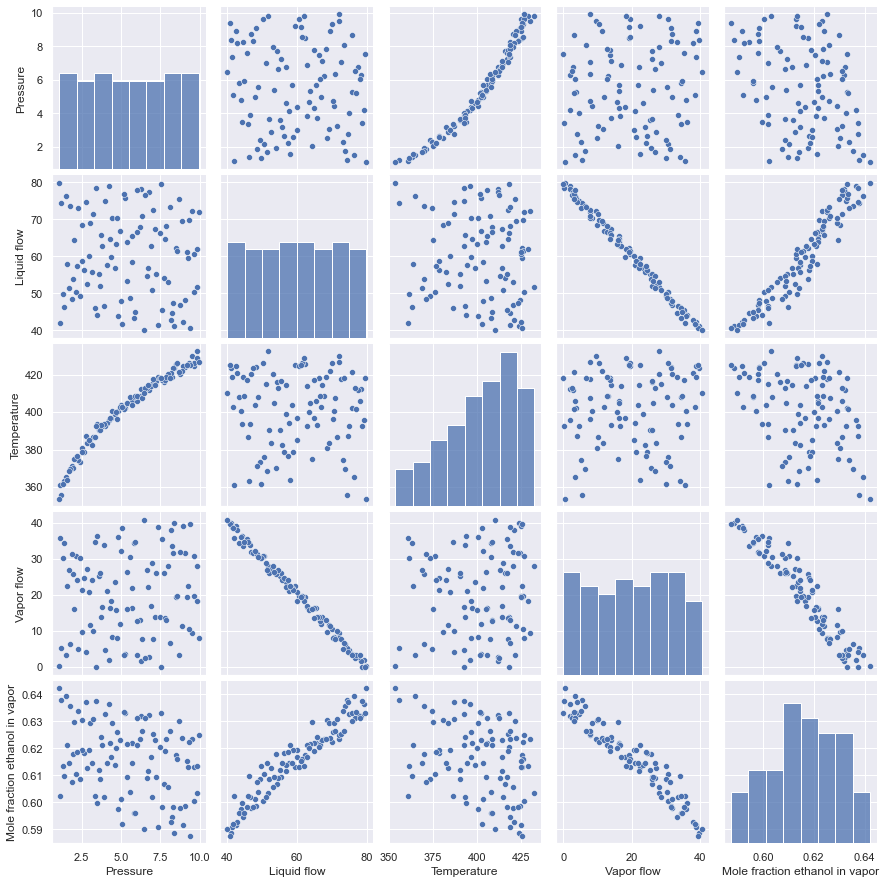

In [11]:
sb.set_theme()
sb.pairplot(fl)

In [12]:
fl.corr()

,Pressure,Liquid flow,Temperature,Vapor flow,Mole fraction ethanol in vapor
Pressure,1.000000,-0.064285,0.975527,0.082519,-0.320131
Liquid flow,-0.064285,1.000000,-0.061044,-0.996308,0.958008
Temperature,0.975527,-0.061044,1.000000,0.077705,-0.322230
Vapor flow,0.082519,-0.996308,0.077705,1.000000,-0.957852
Mole fraction ethanol in vapor,-0.320131,0.958008,-0.322230,-0.957852,1.000000


<AxesSubplot:>

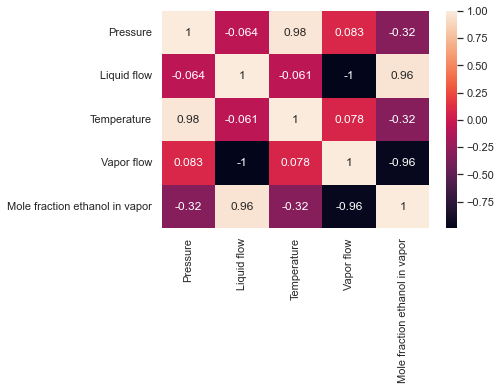

In [13]:
sb.heatmap(fl.corr(), annot=True)

### Fazit (Flash):
A few parameters show a positive (+) or negative (-) linear correlation (Pearson): **Temperature to Pressure (+), Liquid Flow to Mole fraction ethanol in vapor (+) and Vapor Flow to Mole fraction ethanol in vapor (-), Liquid Flow to Vapor Flow (-)**

## Plotting the Matrix Scatterplot and the Correlation Matrix - Manufacturing 

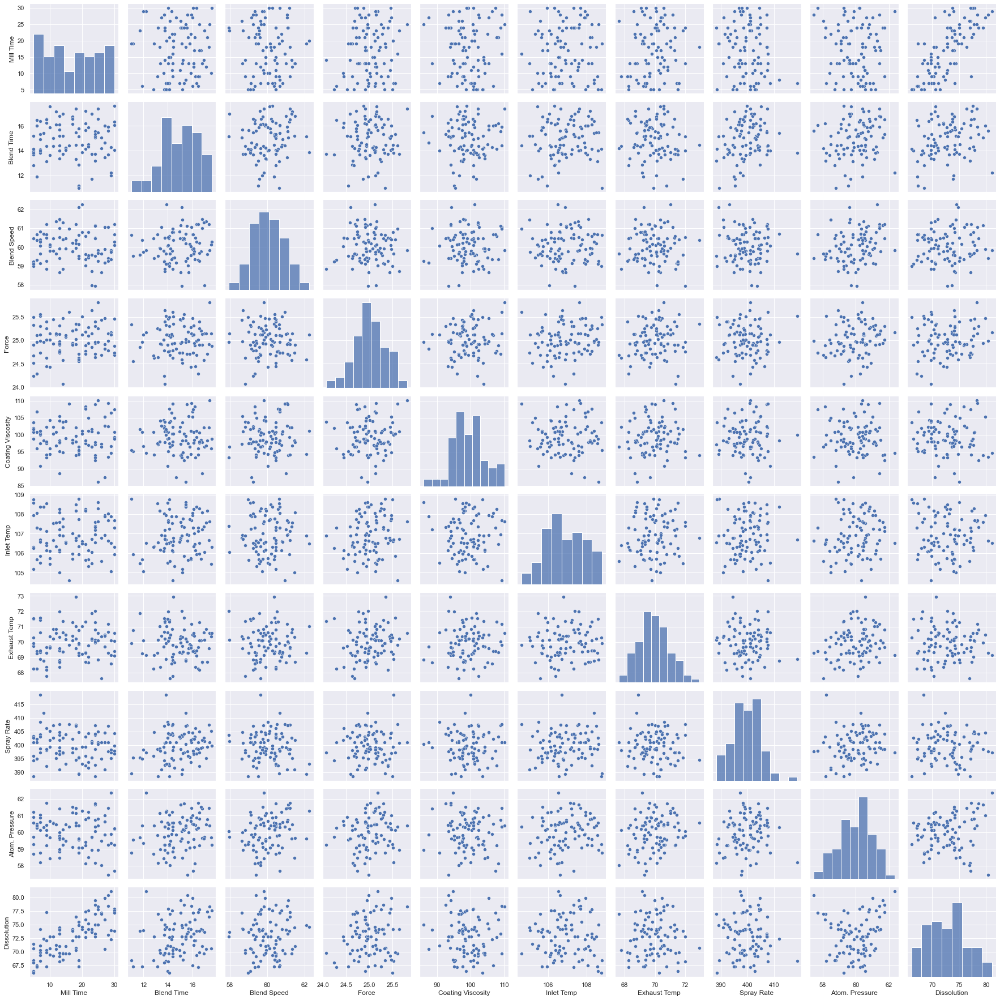

In [14]:
sb.pairplot(m.drop('Screen Size', axis='columns', inplace=False)) #I considered 'Screen Size' column as a categorical variable

In [15]:
m.corr()

,Mill Time,Blend Time,Blend Speed,Force,Coating Viscosity,Inlet Temp,Exhaust Temp,Spray Rate,Atom. Pressure,Dissolution
Mill Time,1.000000,0.000444,-0.043589,0.111594,0.005740,0.021729,0.080987,-0.138123,-0.077451,0.722216
Blend Time,0.000444,1.000000,0.134847,0.024132,0.022336,0.097744,-0.125669,0.214470,0.184099,0.269179
Blend Speed,-0.043589,0.134847,1.000000,-0.030101,0.048184,0.005872,-0.018398,-0.074469,0.263164,0.072481
Force,0.111594,0.024132,-0.030101,1.000000,0.092765,0.153461,0.140177,0.042068,0.150565,0.120293
Coating Viscosity,0.005740,0.022336,0.048184,0.092765,1.000000,-0.033103,0.057023,0.028669,-0.061518,-0.034782
Inlet Temp,0.021729,0.097744,0.005872,0.153461,-0.033103,1.000000,0.076051,0.060281,0.147555,-0.038478
Exhaust Temp,0.080987,-0.125669,-0.018398,0.140177,0.057023,0.076051,1.000000,-0.062845,0.197723,-0.025647
Spray Rate,-0.138123,0.214470,-0.074469,0.042068,0.028669,0.060281,-0.062845,1.000000,0.138009,-0.007919
Atom. Pressure,-0.077451,0.184099,0.263164,0.150565,-0.061518,0.147555,0.197723,0.138009,1.000000,0.149630
Dissolution,0.722216,0.269179,0.072481,0.120293,-0.034782,-0.038478,-0.025647,-0.007919,0.149630,1.000000


<AxesSubplot:>

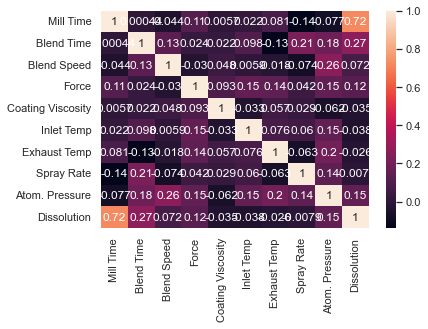

In [16]:
sb.heatmap(m.corr(), annot=True)

### Fazit (Manufacturing):
One linear trend between parameters (Pearson) was observed: **Mill Time to Dissolution (positive +)**.

Additionally, I have plotted the matrix adding the columns with categorical parameters ('hue') to investigate their potential influance on the numerical variables. The visualization didn't deliever much extra information. The foundings are: 
1. Dissolution is proportional to the Screen Size (cell [18]) 
2. Dissolution of the Sweet Sugar(?) is slightly lower than of the Sour Sugar(?) (cell [24]; the 'Sugar Supplier' category)

In [17]:
m_obj = m.dtypes.index[m.dtypes=='object'].values.tolist() #the list with the column names of the categorical variables
m_obj

['API Particle Size',
 'Screen Size',
 'MgSt Supplier',
 'Lactose Supplier',
 'Sugar Supplier',
 'Talc Supplier',
 'Compressor',
 'Coating Supplier']

In [18]:
# the following loop took too much time to load in, so I have divided it into smaller chunks of the code
#for i in m_obj:
#    sb.pairplot(m, hue=i)

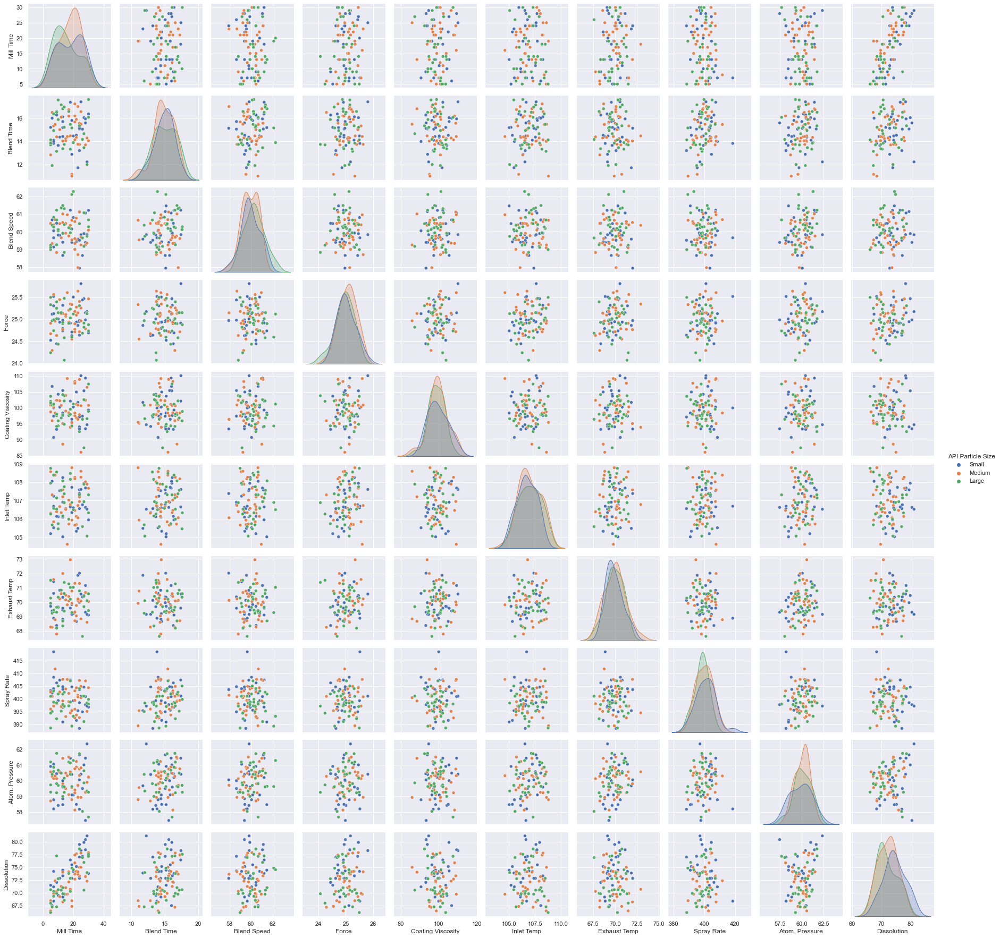

In [19]:
sb.pairplot(m.drop('Screen Size', axis='columns', inplace=False), hue='API Particle Size')

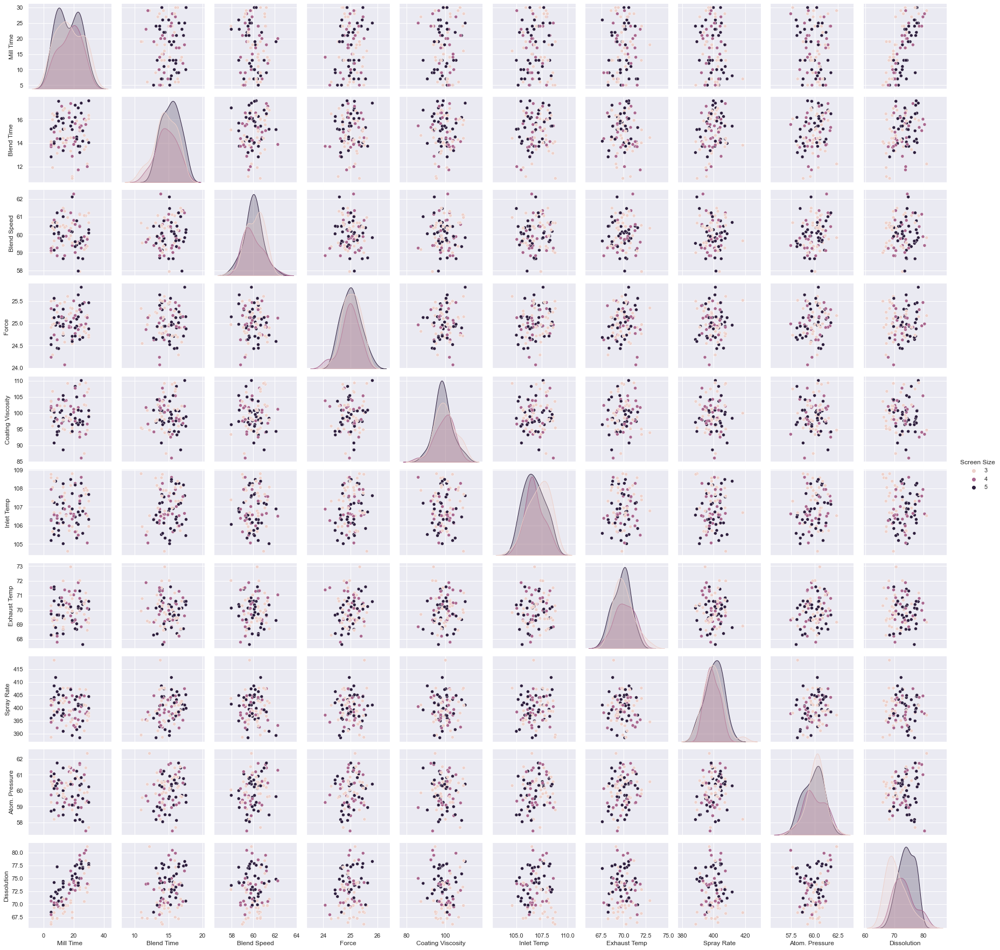

In [21]:
sb.pairplot(m, hue='Screen Size')

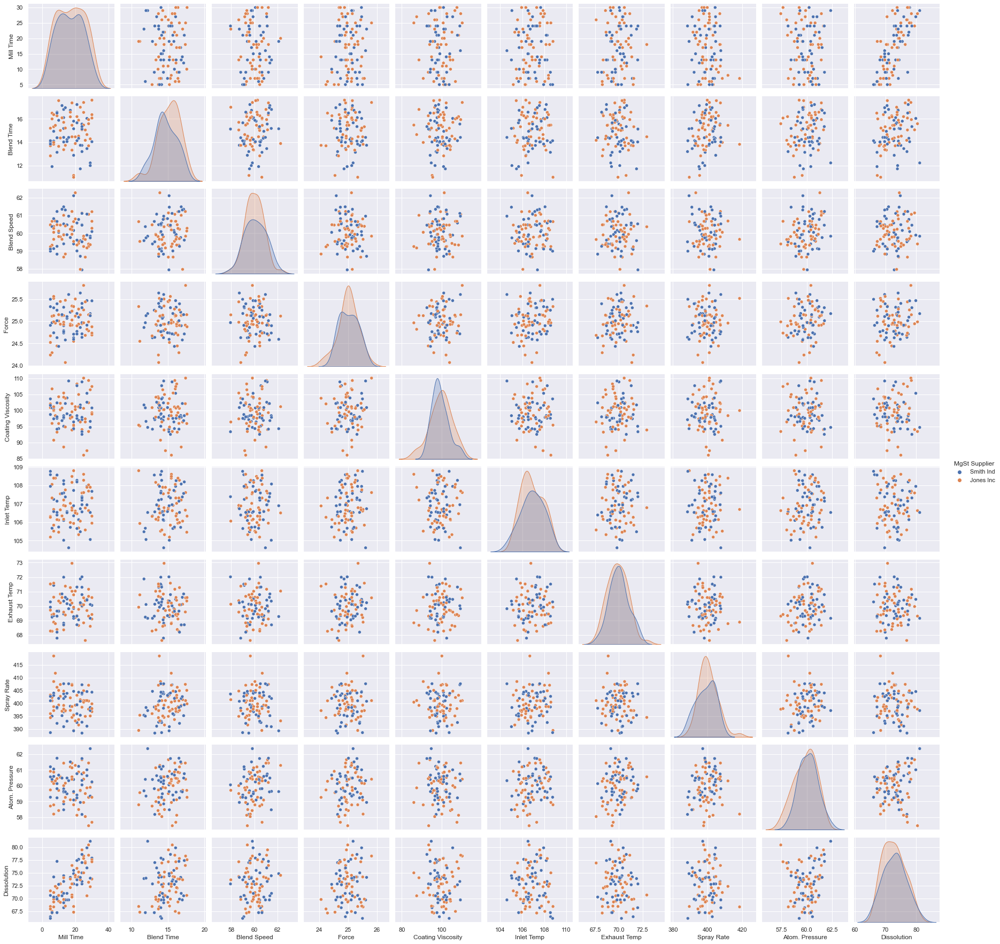

In [22]:
sb.pairplot(m.drop('Screen Size', axis='columns', inplace=False), hue='MgSt Supplier')

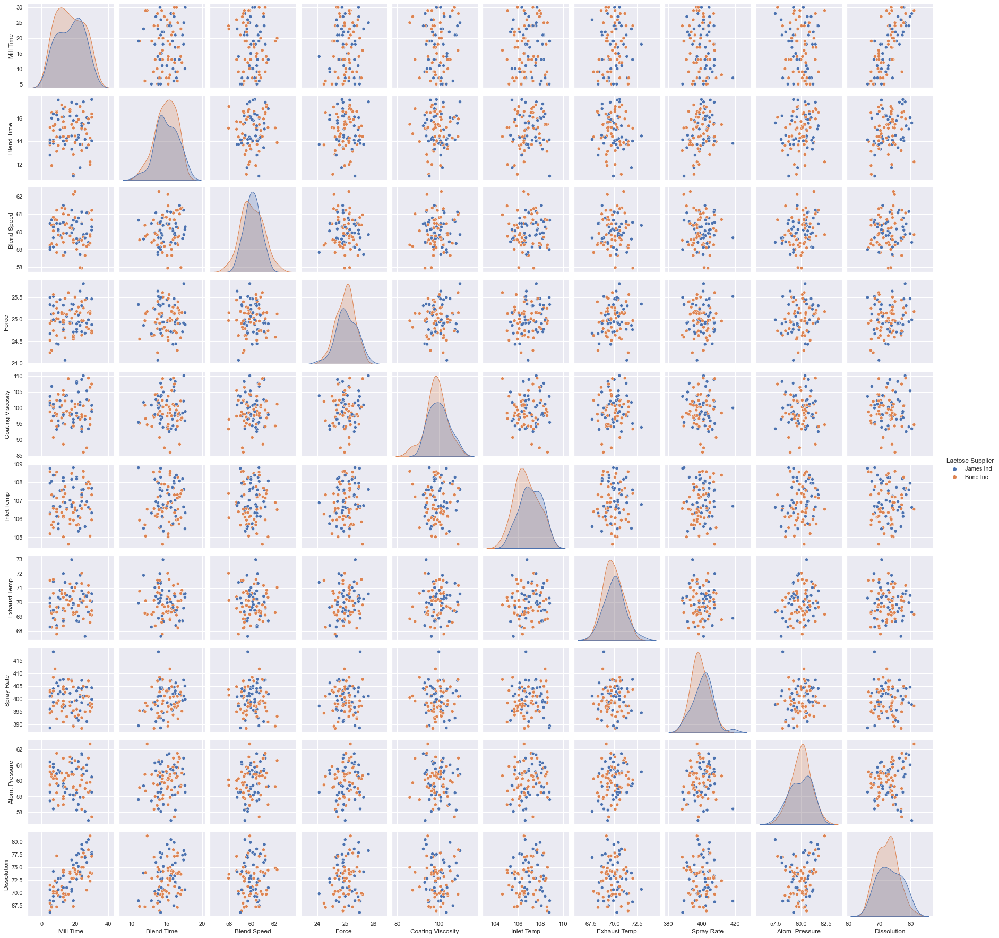

In [23]:
sb.pairplot(m.drop('Screen Size', axis='columns', inplace=False), hue='Lactose Supplier')

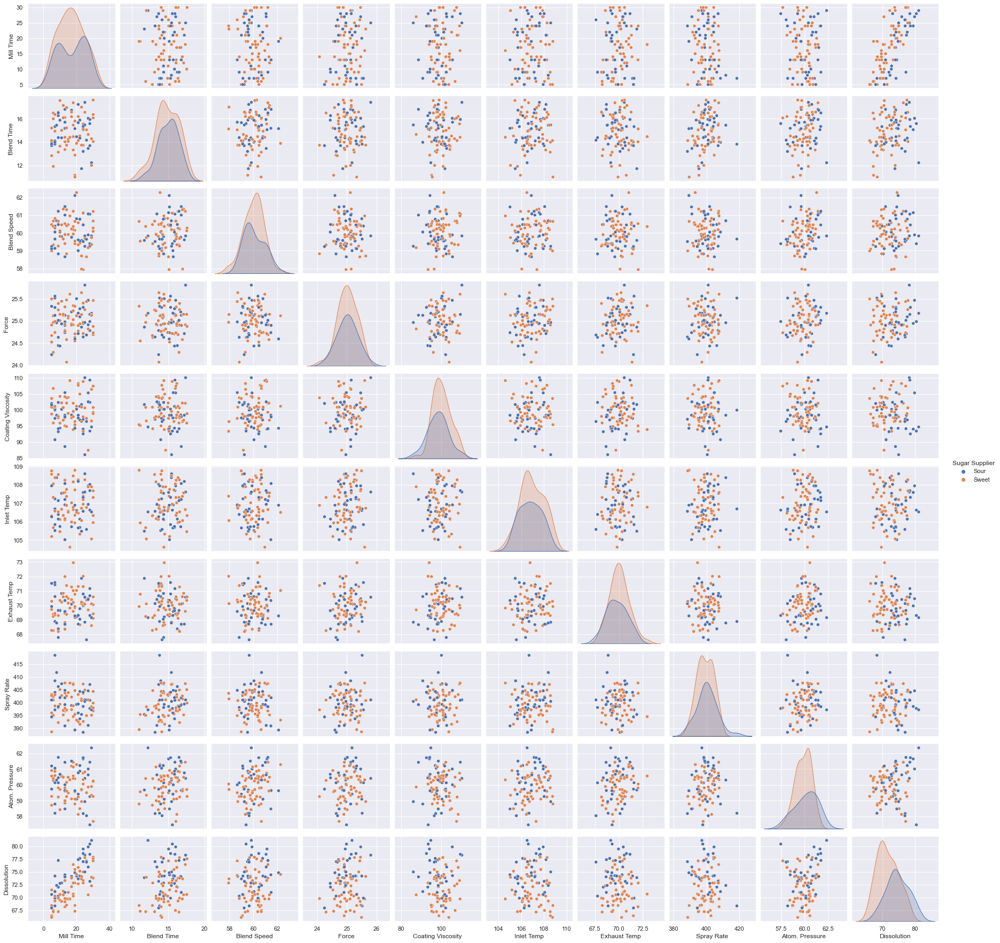

In [24]:
sb.pairplot(m.drop('Screen Size', axis='columns', inplace=False), hue='Sugar Supplier')

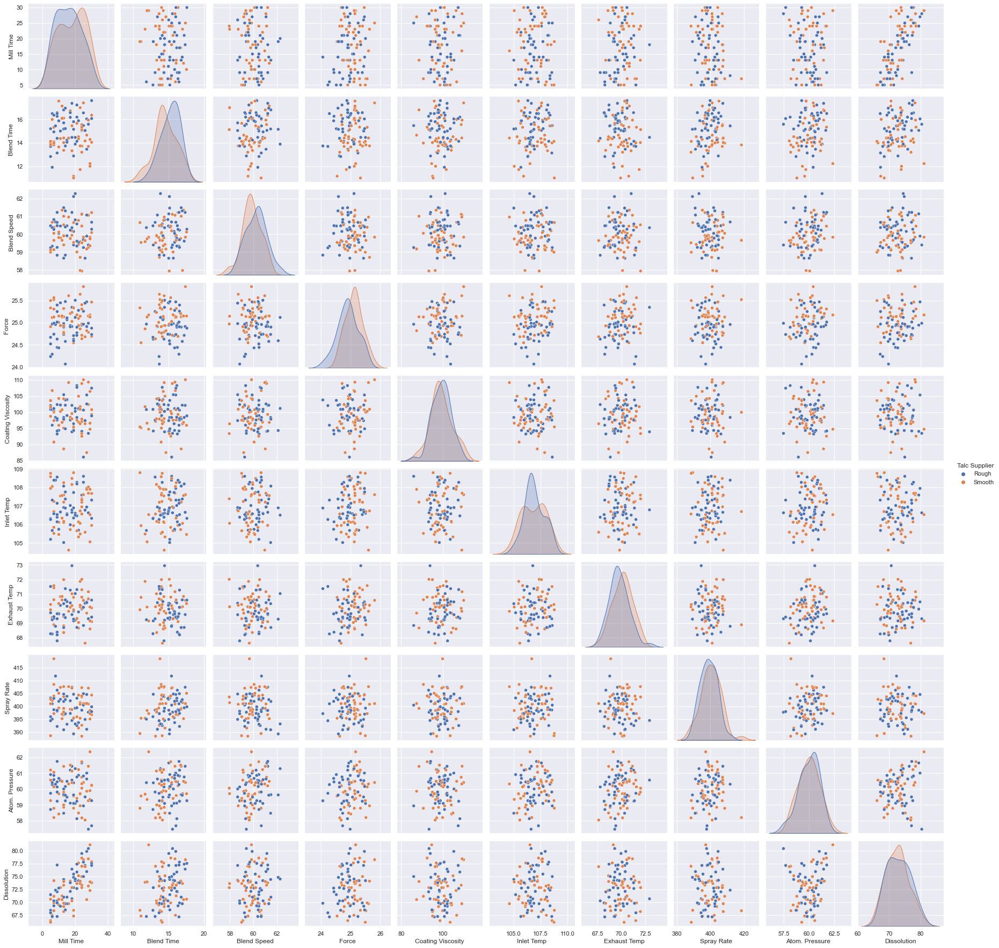

In [25]:
sb.pairplot(m.drop('Screen Size', axis='columns', inplace=False), hue='Talc Supplier')

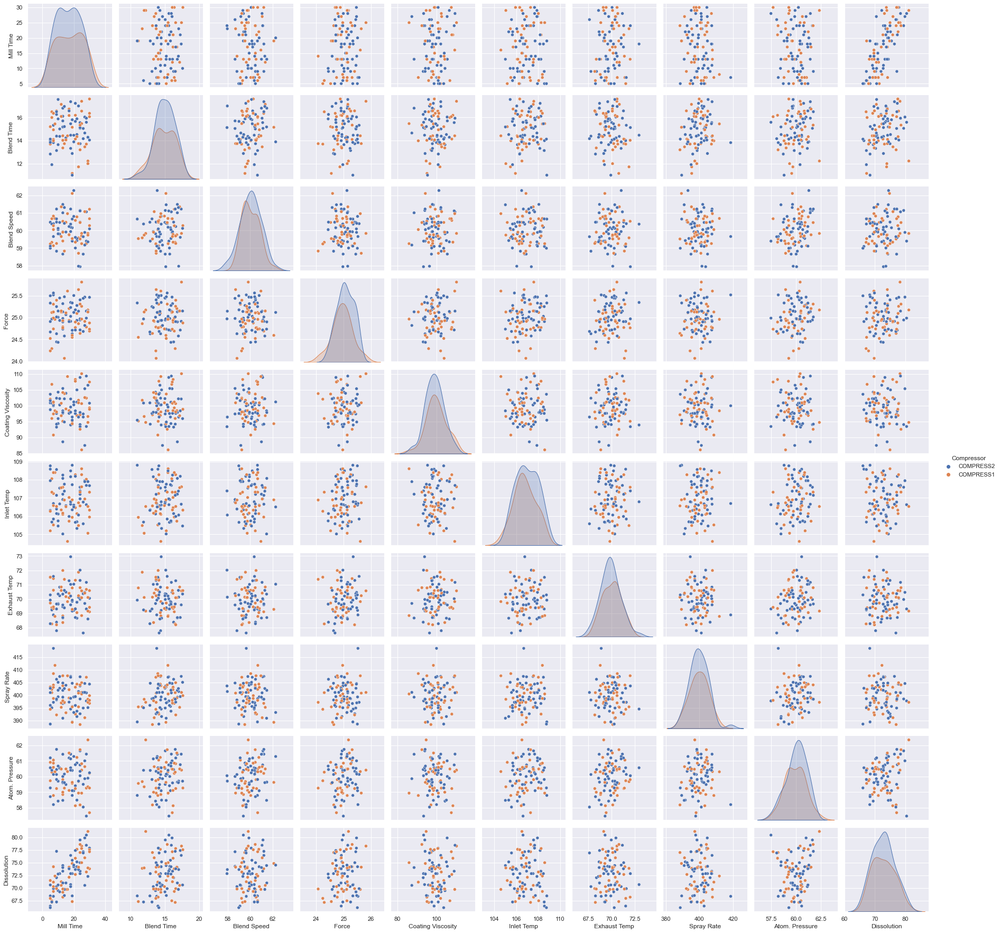

In [26]:
sb.pairplot(m.drop('Screen Size', axis='columns', inplace=False), hue='Compressor')

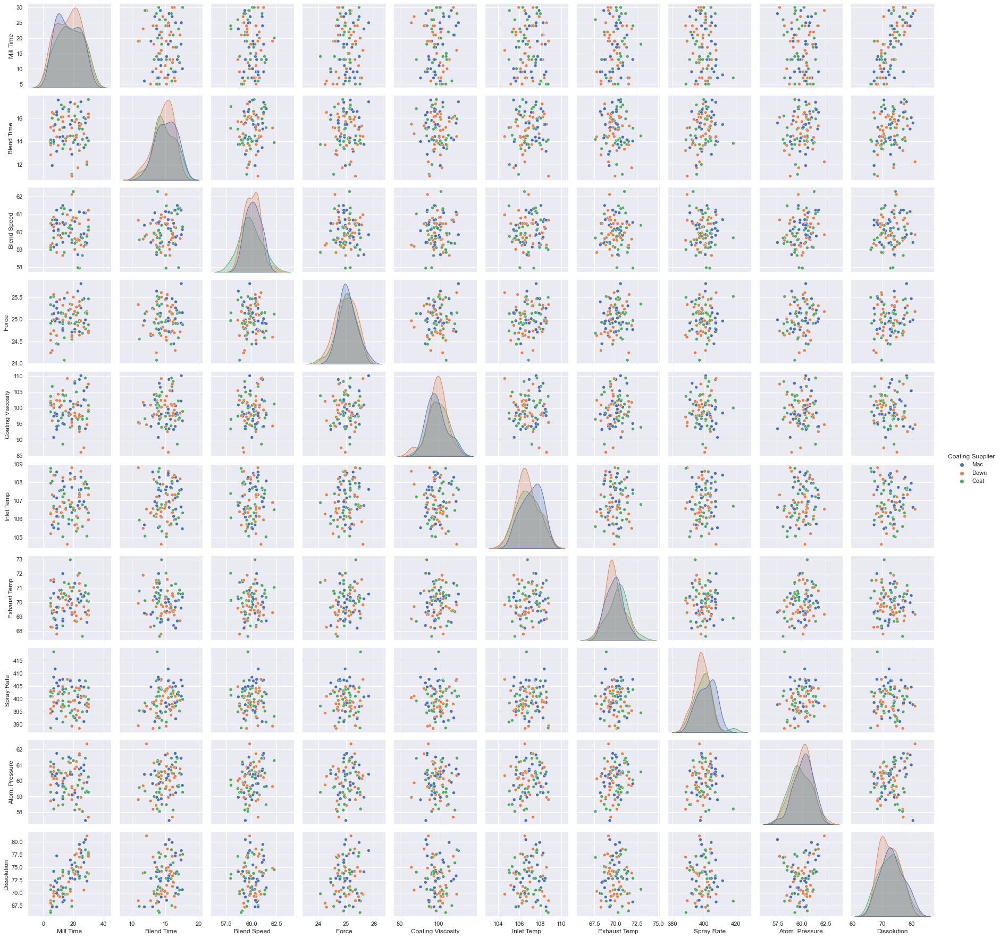

In [27]:
sb.pairplot(m.drop('Screen Size', axis='columns', inplace=False), hue='Coating Supplier')